# Import Libraries

In [1]:
import numpy as np
import wfdb
import hrvanalysis
import matplotlib.pyplot as plt
from wfdb import get_record_list,plot_wfdb
from wfdb.io import rdheader,rdann,rdrecord
from wfdb.processing import normalize_bound
import  ecgdetectors
import scipy
from scipy import signal
import pandas as pd
from scipy.signal import hilbert,find_peaks
from PyEMD import EMD,Visualisation,CEEMDAN
from hrvanalysis import remove_outliers, remove_ectopic_beats, interpolate_nan_values
from scipy.interpolate import interp1d
from scipy.integrate import trapz
import os
import glob
from scipy.stats import skew
from hrvanalysis import get_frequency_domain_features,get_csi_cvi_features,get_geometrical_features,get_poincare_plot_features
from scipy.stats import skew
from scipy.stats import zscore
import heartpy
from scipy.interpolate import splev, splrep

In [2]:
for i in os.listdir(r'E:\sleep_apnea\M1\apnea-ecg-database-1.0.0'):
    print((i))
    

a01.apn
a01.dat
a01.hea
a01.qrs
a01.xws
a01er.apn
a01er.hea
a01er.qrs
a01er.xws
a01r.apn
a01r.dat
a01r.hea
a02.apn
a02.dat
a02.hea
a02.qrs
a02.xws
a02er.apn
a02er.hea
a02er.qrs
a02er.xws
a02r.apn
a02r.dat
a02r.hea
a03.apn
a03.dat
a03.hea
a03.qrs
a03.xws
a03er.apn
a03er.hea
a03er.qrs
a03er.xws
a03r.apn
a03r.dat
a03r.hea
a04.apn
a04.dat
a04.hea
a04.qrs
a04.xws
a04er.apn
a04er.hea
a04er.qrs
a04er.xws
a04r.apn
a04r.dat
a04r.hea
a05.apn
a05.dat
a05.hea
a05.qrs
a05.xws
a06.apn
a06.dat
a06.hea
a06.qrs
a06.xws
a07.apn
a07.dat
a07.hea
a07.qrs
a07.xws
a08.apn
a08.dat
a08.hea
a08.qrs
a08.xws
a09.apn
a09.dat
a09.hea
a09.qrs
a09.xws
a10.apn
a10.dat
a10.hea
a10.qrs
a10.xws
a11.apn
a11.dat
a11.hea
a11.qrs
a11.xws
a12.apn
a12.dat
a12.hea
a12.qrs
a12.xws
a13.apn
a13.dat
a13.hea
a13.qrs
a13.xws
a14.apn
a14.dat
a14.hea
a14.qrs
a14.xws
a15.apn
a15.dat
a15.hea
a15.qrs
a15.xws
a16.apn
a16.dat
a16.hea
a16.qrs
a16.xws
a17.apn
a17.dat
a17.hea
a17.qrs
a17.xws
a18.apn
a18.dat
a18.hea
a18.qrs
a18.xws
a19.apn
a19.

In [3]:
train_name=['a01','a02','a03','a04','a05','a06','a07','a08','a09','a10','a11','a12','a13','a14','a15','a16','a17','a18','a19','a20','b01','b02','b03','b04','b05','c01','c02','c03','c04','c05','c06','c07','c08','c09','c10']
test_name=['x01','x02','x03','x04','x05','x06','x07','x08','x09','x10','x11','x12','x13','x14','x15','x16','x17','x18','x19','x20']

In [38]:
def get_signal_from_dir(file_path):
    ann=rdann(record_name=file_path,extension='apn',pn_dir=None)
    signals, fields = wfdb.rdsamp(file_path,pn_dir=None)
    fs=fields['fs']
    T=1/fs;
    t=np.arange(0,fields['sig_len'])*T
    #t=np.arange(0,fields['sig_len'])*T
    signals=200.*signals;
    signals=(signals-np.min(signals))/(np.max(signals)-np.min(signals))
    signals=pd.DataFrame(signals)[0].values
    signals=heartpy.remove_baseline_wander(signals,fs,cutoff=0.05)
    return signals,ann,t

In [85]:
def segment_signal(signals,ann,t):
    segmented_series=[]
    time_series=[]
    for i in ann:
        #print(i)
        temp=signals[i:i+6000]
        T_im=t[0:6000]
        segmented_series.append(temp)
        time_series.append(T_im)
    return segmented_series,time_series

In [86]:
def peaks(signals,t):
    #emd=EMD()
    #IMFs=emd(signals,t)
    #imfs,res=emd.get_imfs_and_residue()
    peaks,_=find_peaks(signals,height=np.max(signals)/2)
    rr=np.diff(t[peaks])
    amp=signals[peaks]
    R_amp=amp
    rr_tm=t[peaks]
    rr_tm=rr_tm[0:len(rr)]
    R_amp=R_amp[0:len(rr)]
    return peaks,rr,R_amp,rr_tm

In [90]:
time_range=60
ir=3
def hrv_signal(rr,amp,rr_tm):
    tm = np.arange(0, (time_range), step=(1) / float(ir))
    interpolated_rr=splev(tm,splrep(rr_tm,rr,k=3),ext=0)
    interpolated_ramp=splev(tm,splrep(rr_tm,amp,k=3),ext=0)
    net_input=np.concatenate((interpolated_ramp,interpolated_rr,),axis=0)
    return net_input

[0.000000e+00 1.000000e-02 2.000000e-02 ... 2.956997e+04 2.956998e+04
 2.956999e+04]
[0.02 0.02 0.02 ... 0.02 0.02 0.02]
[0.4023587  0.40224802 0.40256902 ... 0.40069259 0.40667831 0.4012186 ]
[2.000e-02 4.000e-02 6.000e-02 ... 5.992e+01 5.994e+01 5.996e+01]
[0.04 0.07 0.02 ... 0.03 0.04 0.02]
[0.40818991 0.40987695 0.39874975 ... 0.40269734 0.40272838 0.40430952]
[3.000e-02 7.000e-02 1.400e-01 ... 5.989e+01 5.992e+01 5.996e+01]
[0.02 0.02 0.05 ... 0.02 0.04 0.03]
[0.402404   0.40158306 0.40279451 ... 0.40158728 0.40518934 0.40443993]
[2.000e-02 4.000e-02 6.000e-02 ... 5.987e+01 5.989e+01 5.993e+01]
[0.02 0.02 0.02 ... 0.02 0.02 0.06]
[0.40373958 0.41116945 0.40452817 ... 0.40355244 0.40329132 0.40431015]
[4.000e-02 6.000e-02 8.000e-02 ... 5.988e+01 5.990e+01 5.992e+01]
[0.04 0.02 0.02 ... 0.04 0.02 0.05]
[0.40748861 0.4192915  0.40368515 ... 0.42147213 0.40812365 0.40190641]
[2.000e-02 6.000e-02 8.000e-02 ... 5.985e+01 5.989e+01 5.991e+01]
[0.04 0.05 0.02 ... 0.04 0.1  0.03]
[0.407704

C:\Users\HP\AppData\Local\Temp/ipykernel_8780/2015068732.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,10))


[0.02 0.02 0.04 ... 0.02 0.03 0.03]
[0.40869    0.40515024 0.40543878 ... 0.40564635 0.40929944 0.40862008]
[1.000e-02 3.000e-02 5.000e-02 ... 5.990e+01 5.992e+01 5.995e+01]
[0.03 0.04 0.03 ... 0.06 0.05 0.05]
[0.41194614 0.40791975 0.43992344 ... 0.3959438  0.61577785 0.4167142 ]
[2.000e-02 5.000e-02 9.000e-02 ... 5.981e+01 5.987e+01 5.992e+01]
[0.04 0.03 0.04 ... 0.05 0.05 0.04]
[0.40942725 0.41137786 0.41056894 ... 0.39052119 0.63704469 0.41978235]
[2.000e-02 6.000e-02 9.000e-02 ... 5.984e+01 5.989e+01 5.994e+01]
[0.02 0.02 0.02 ... 0.02 0.09 0.03]
[0.40349739 0.40900342 0.40461158 ... 0.40336037 0.40485547 0.40916268]
[2.000e-02 4.000e-02 6.000e-02 ... 5.983e+01 5.985e+01 5.994e+01]
[0.02 0.02 0.05 ... 0.03 0.06 0.06]
[0.4103809  0.39257904 0.38901441 ... 0.40596554 0.39417437 0.6318526 ]
[1.000e-02 3.000e-02 5.000e-02 ... 5.980e+01 5.983e+01 5.989e+01]
[0.05 0.04 0.02 ... 0.02 0.02 0.02]
[0.40450097 0.4039747  0.41098118 ... 0.40668886 0.41049157 0.40582883]
[2.000e-02 7.000e-02 1

[0.40580962 0.40442419 0.42989894 ... 0.41665287 0.4102387  0.42438725]
[2.000e-02 5.000e-02 8.000e-02 ... 5.989e+01 5.991e+01 5.993e+01]
[0.02 0.03 0.02 ... 0.03 0.03 0.04]
[0.41768736 0.40997006 0.41899219 ... 0.40617763 0.40390794 0.40493702]
[3.000e-02 5.000e-02 8.000e-02 ... 5.988e+01 5.991e+01 5.994e+01]
[0.03 0.03 0.03 ... 0.02 0.04 0.02]
[0.40612302 0.40811778 0.40656089 ... 0.40387538 0.41011212 0.4075746 ]
[3.000e-02 6.000e-02 9.000e-02 ... 5.989e+01 5.991e+01 5.995e+01]
[0.08 0.06 0.02 ... 0.02 0.02 0.06]
[0.40799247 0.40999734 0.40727234 ... 0.40338856 0.40426999 0.40389316]
[2.000e-02 1.000e-01 1.600e-01 ... 5.987e+01 5.989e+01 5.991e+01]
[0.02 0.12 0.05 ... 0.02 0.02 0.02]
[0.40875095 0.40960494 0.40781928 ... 0.40795808 0.4060919  0.40559383]
[1.000e-02 3.000e-02 1.500e-01 ... 5.991e+01 5.993e+01 5.995e+01]
[0.02 0.02 0.02 ... 0.05 0.02 0.04]
[0.40508249 0.40583477 0.40734028 ... 0.40473136 0.40804367 0.40864109]
[1.000e-02 3.000e-02 5.000e-02 ... 5.987e+01 5.992e+01 5.9

[0.02 0.02 0.04 ... 0.02 0.06 0.06]
[0.40435168 0.40307583 0.40682461 ... 0.40472813 0.39031062 0.63412342]
[1.000e-02 3.000e-02 5.000e-02 ... 5.983e+01 5.985e+01 5.991e+01]
[0.02 0.02 0.02 ... 0.04 0.02 0.03]
[0.40454991 0.40371321 0.40514816 ... 0.40891945 0.40345919 0.405183  ]
[3.000e-02 5.000e-02 7.000e-02 ... 5.988e+01 5.992e+01 5.994e+01]
[0.02 0.02 0.03 ... 0.02 0.05 0.04]
[0.40899304 0.4065007  0.40765004 ... 0.4083503  0.40680832 0.4073217 ]
[2.000e-02 4.000e-02 6.000e-02 ... 5.984e+01 5.986e+01 5.991e+01]
[0.03 0.03 0.02 ... 0.03 0.02 0.04]
[0.40568884 0.40981338 0.40609721 ... 0.4044358  0.40458626 0.40569801]
[1.000e-02 4.000e-02 7.000e-02 ... 5.986e+01 5.989e+01 5.991e+01]
[0.07 0.02 0.04 ... 0.02 0.04 0.02]
[0.40356553 0.40684644 0.42841744 ... 0.40460198 0.40492036 0.40492123]
[1.000e-02 8.000e-02 1.000e-01 ... 5.989e+01 5.991e+01 5.995e+01]
[0.04 0.02 0.02 ... 0.05 0.03 0.02]
[0.40482316 0.40513504 0.40410804 ... 0.40439068 0.40531609 0.40532142]
[4.000e-02 8.000e-02 1

[0.03 0.02 0.04 ... 0.05 0.02 0.02]
[0.40995767 0.40641419 0.41214817 ... 0.7294024  0.41004973 0.40589369]
[1.000e-02 4.000e-02 6.000e-02 ... 5.989e+01 5.994e+01 5.996e+01]
[0.03 0.02 0.04 ... 0.02 0.04 0.03]
[0.40339343 0.40568172 0.40638454 ... 0.40565003 0.40427397 0.40851353]
[3.000e-02 6.000e-02 8.000e-02 ... 5.986e+01 5.988e+01 5.992e+01]
[0.06 0.06 0.1  ... 0.04 0.02 0.04]
[0.39103088 0.6072536  0.41638033 ... 0.40778485 0.40848343 0.40499002]
[2.000e-02 8.000e-02 1.400e-01 ... 5.985e+01 5.989e+01 5.991e+01]
[0.02 0.02 0.03 ... 0.02 0.03 0.02]
[0.40513277 0.40898284 0.40553618 ... 0.41664971 0.4141158  0.41890688]
[1.000e-02 3.000e-02 5.000e-02 ... 5.989e+01 5.991e+01 5.994e+01]
[0.02 0.02 0.02 ... 0.02 0.02 0.04]
[0.41261569 0.40786503 0.41443784 ... 0.40409199 0.4047757  0.4060239 ]
[1.000e-02 3.000e-02 5.000e-02 ... 5.985e+01 5.987e+01 5.989e+01]
[0.02 0.04 0.02 ... 0.03 0.03 0.02]
[0.40289791 0.40289134 0.40523375 ... 0.40519154 0.40495891 0.40434977]
[4.000e-02 6.000e-02 1

[0.40758755 0.40855063 0.40574246 ... 0.40902588 0.40952286 0.40899357]
[1.000e-02 4.000e-02 9.000e-02 ... 5.988e+01 5.990e+01 5.993e+01]
[0.03 0.04 0.03 ... 0.02 0.02 0.03]
[0.40483935 0.41133336 0.40770971 ... 0.40609295 0.40529929 0.40553524]
[2.000e-02 5.000e-02 9.000e-02 ... 5.990e+01 5.992e+01 5.994e+01]
[0.02 0.02 0.04 ... 0.03 0.05 0.02]
[0.40477663 0.40595051 0.40148954 ... 0.40723709 0.42426197 0.40779308]
[1.000e-02 3.000e-02 5.000e-02 ... 5.984e+01 5.987e+01 5.992e+01]
[0.05 0.04 0.06 ... 0.03 0.02 0.03]
[0.68171906 0.4239558  0.40636262 ... 0.40661777 0.40501063 0.40597437]
[1.000e-02 6.000e-02 1.000e-01 ... 5.987e+01 5.990e+01 5.992e+01]
[0.02 0.04 0.03 ... 0.04 0.07 0.05]
[0.40416581 0.40468119 0.4047075  ... 0.41293931 0.39701025 0.72088946]
[1.000e-02 3.000e-02 7.000e-02 ... 5.981e+01 5.985e+01 5.992e+01]
[0.03 0.02 0.02 ... 0.04 0.03 0.03]
[0.40751273 0.40469338 0.40926103 ... 0.40642326 0.40877303 0.4104512 ]
[2.000e-02 5.000e-02 7.000e-02 ... 5.988e+01 5.992e+01 5.9

KeyboardInterrupt: 

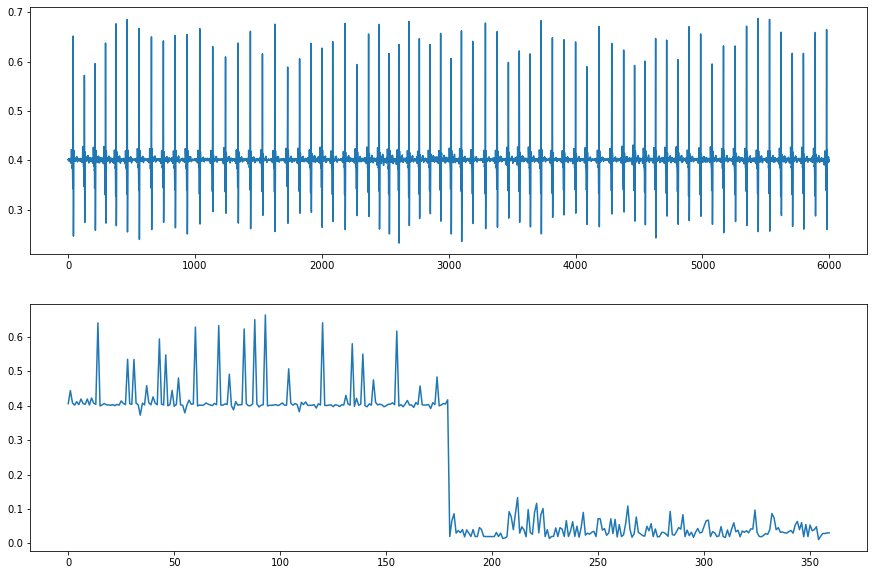

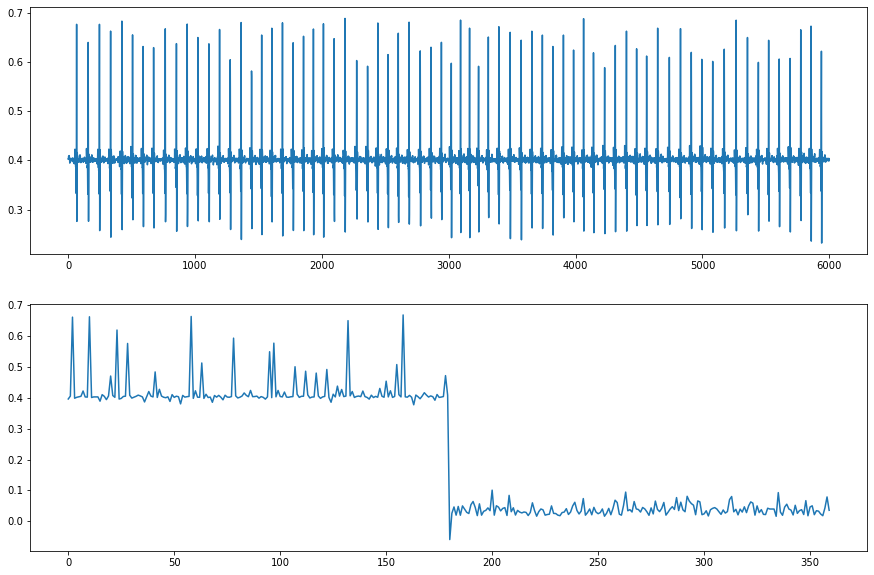

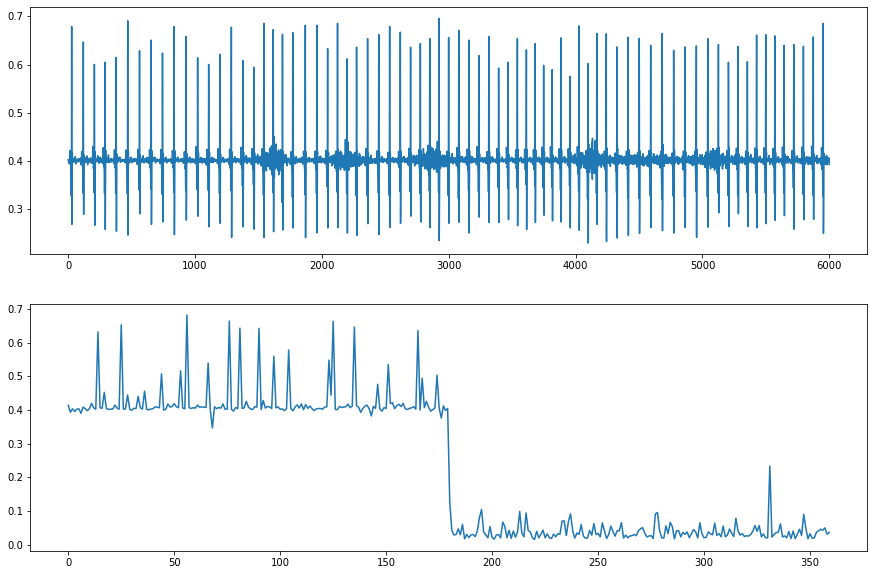

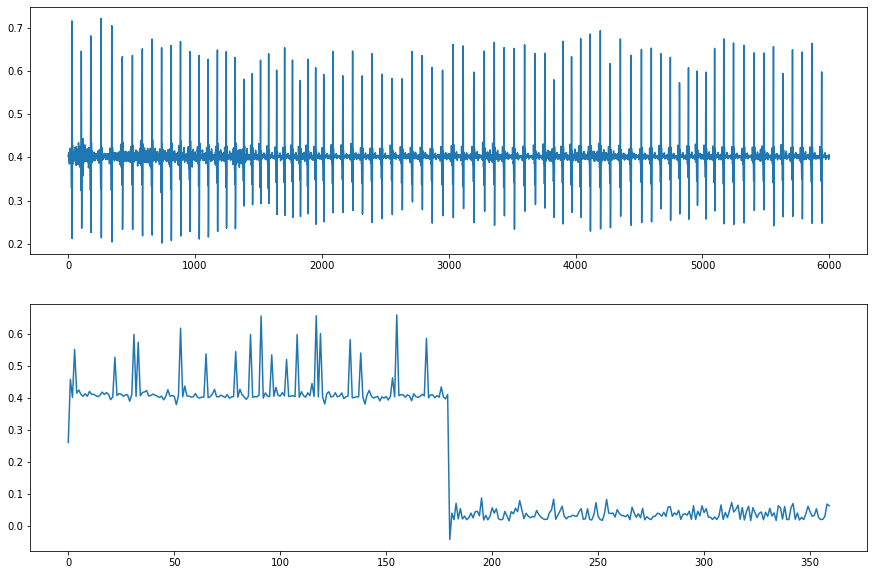

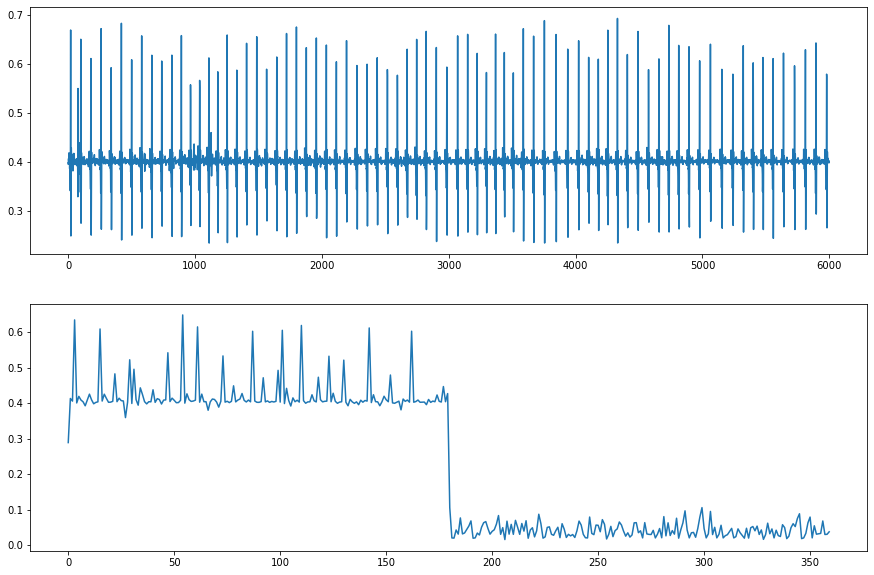

...

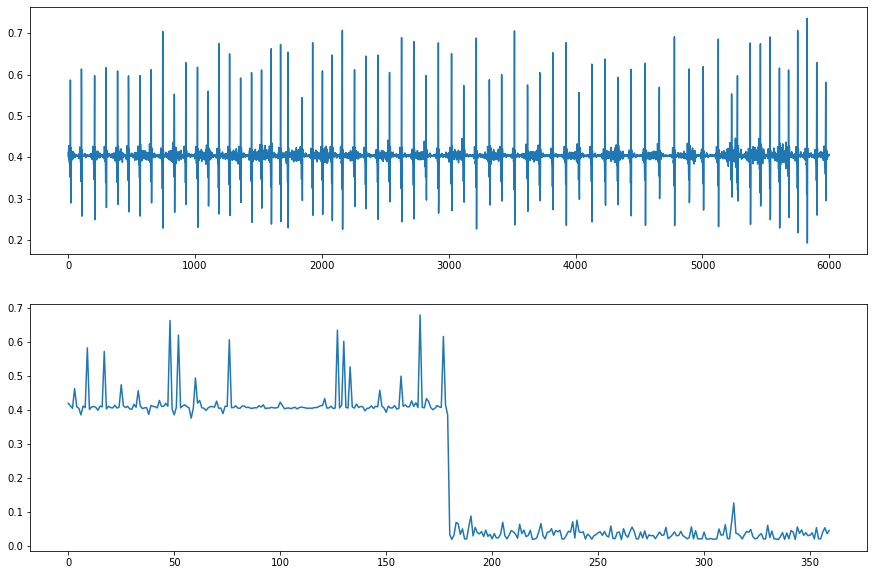

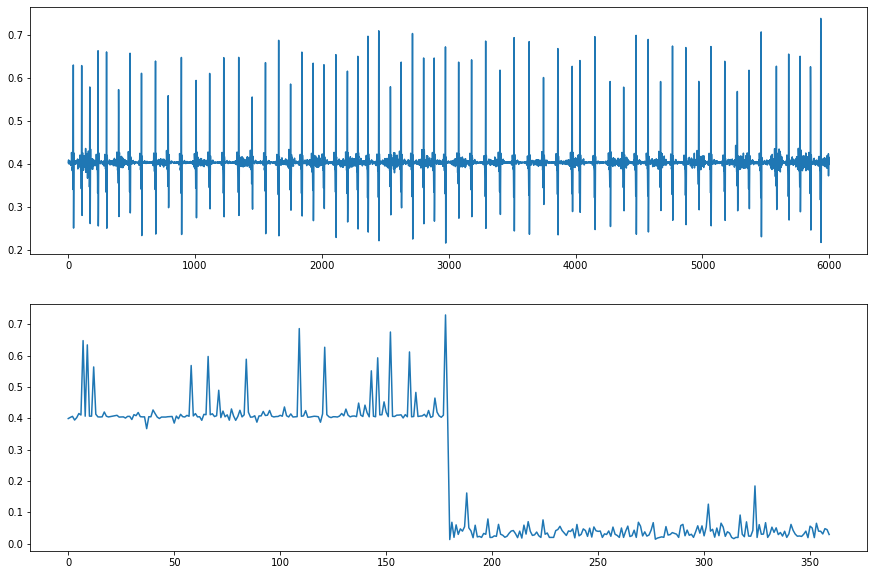

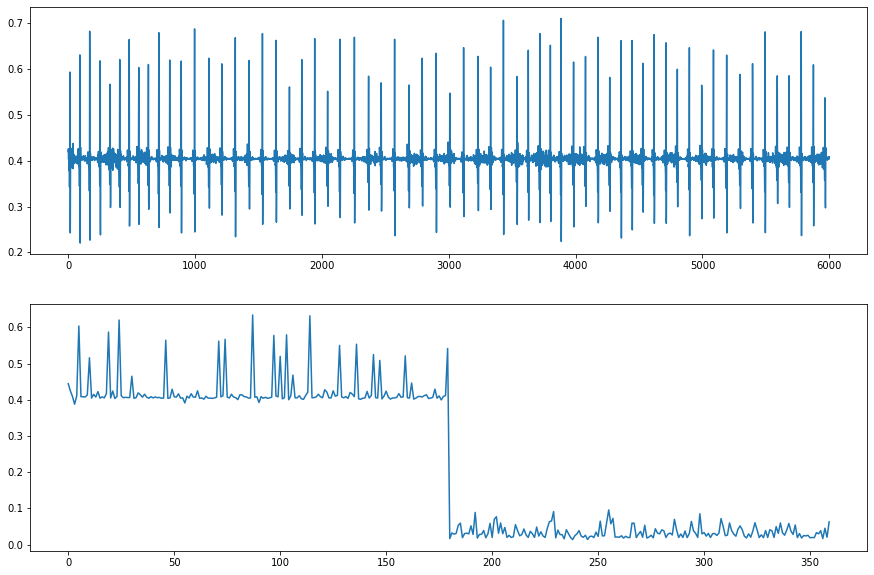

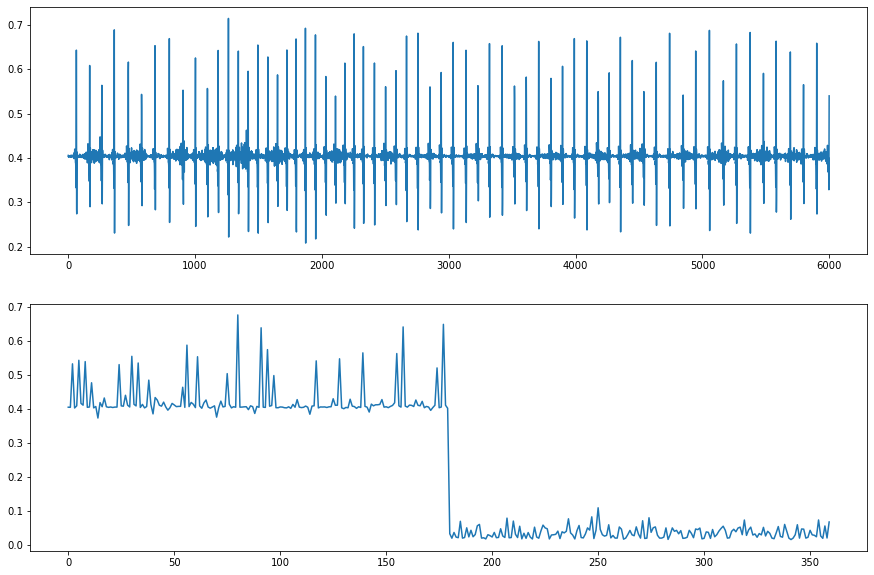

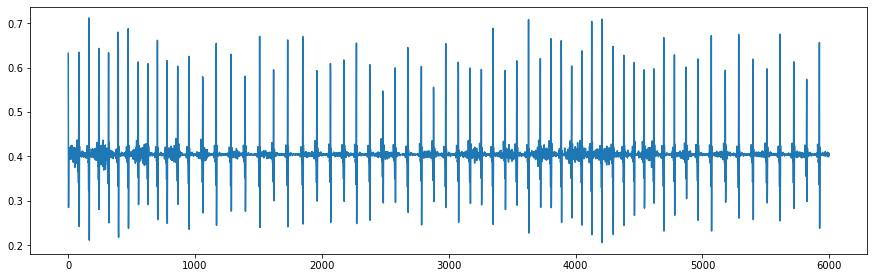

In [92]:
#r=os.path.join('D:\sleep_apnea\apnea-ecg-database-1.0.0','a01')
train_name=['a01']

for i in train_name:
    file=os.path.join(r'E:\sleep_apnea\M1\apnea-ecg-database-1.0.0',i)
    #print(file)
    [signals,annotation,time]=get_signal_from_dir(file)
    #print(time)
    [segmented_series,time_series]=segment_signal(signals,annotation.sample,time)
    #print(time_series)
    net_input=[]
    for j in range(0,len(segmented_series)):
        #print(j)
        S=annotation.symbol[j]
        #print(annotation.symbol[j])
        loc,rr,amp,rr_tm=peaks( segmented_series[j],time_series[j])
        #print(rr)
        signal_input=hrv_signal(rr,amp,rr_tm)
        plt.figure(figsize=(15,10))
        plt.subplot(211),plt.plot(segmented_series[j])
        plt.subplot(212),plt.plot(signal_input)
        
        print(amp)
        #print(rr_tm)
        #plt.figure(figsize=(15,10))
        #plt.plot(tm,interpolated_rr)
        #print(len(rr))
        print((rr_tm))
        #print(len(amp))
        #plt.figure(figsize=(15,10))
        #plt.plot(tm,interpolated_ramp)
        #print(interpolated_rr)
        #print('/n')
       # print(interpolated_ramp)
        #print('/n')
        
        #print(net_input)


In [65]:
train_name=['a01']

for i in train_name:
    file=os.path.join(r'E:\sleep_apnea\M1\apnea-ecg-database-1.0.0',i)
    #print(file)
    [signals,annotation,time]=get_signal_from_dir(file)
    print(time)

[0.000000e+00 1.000000e-02 2.000000e-02 ... 2.956997e+04 2.956998e+04
 2.956999e+04]


In [80]:
time[6000:12000]-60


array([0.000e+00, 1.000e-02, 2.000e-02, ..., 5.997e+01, 5.998e+01,
       5.999e+01])

In [43]:
a=np.array([1,2])
b=np.array([1,3])
s=np.concatenate((a,b),axis=0)
s

array([1, 2, 1, 3])

In [21]:
plt.figure(figsize=(20,10))
plt.plot(net_input[3])

IndexError: list index out of range

<Figure size 1440x720 with 0 Axes>

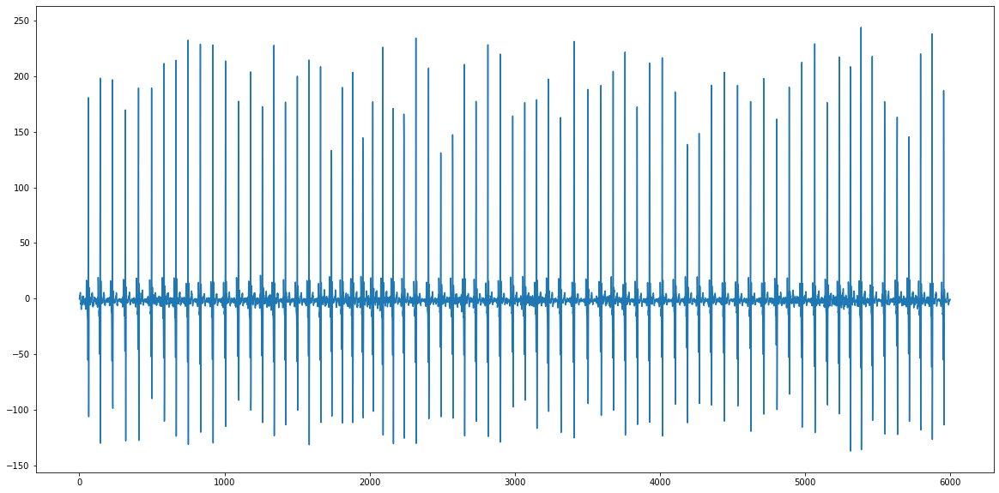

In [11]:
plt.figure(figsize=(20,10))
plt.plot(segmented_series[5])

In [12]:
df

NameError: name 'df' is not defined

In [ ]:
#df.to_csv('c10_1.csv')